# Gibbs chain verification

In [1]:
import os, sys, time
import numpy as np
import matplotlib.pyplot as plt
import scipy
import healpy as hp
import astropy.io.fits as fits
import camb
import jax
import jax.numpy as jnp
import jax.scipy as jsp
import jax_healpy as jhp
import numpyro
from functools import partial
import micmac as micmac

from jax import config
config.update("jax_enable_x64", True)

In [2]:
sys.path.append(os.path.dirname(os.path.abspath('')))
sys.path.append(os.path.dirname(os.path.dirname(os.path.abspath('')))+'/tutorials/')
# from func_tools_for_tests import *
from get_freq_maps_SO_64 import *
# from get_freq_maps_LiteBIRD_64 import *

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Shape for input frequency maps : (6, 2, 49152)
Shape for input cmb maps : (6, 2, 49152)


In [3]:
working_directory_path = os.path.abspath('') + '/'
directory_save_file = working_directory_path + 'save_directory/'
directory_toml_file = working_directory_path + 'toml_params/'

path_toml_file = directory_toml_file + 'test_full_chain_v1a.toml'
path_toml_file = directory_toml_file + 'test_classical_chain_v1a.toml'


# Studying the sampling !

In [4]:
file_ver = 'full_v9_classGchain_SO_noise_v6a' # -> 10 iterations, seed 43, 1c toml file, step-size_r 1e-4 + reduced noise by 100 + classGibbs + test_full_chain_v1a + C_approx only lensing ; start_r=10**(-2) + exact values B_f
sub_step_sampling = 1
reduction_noise = 1
file_ver = 'full_v9_classGchain_SO_noise_v6b' # -> 1000 iterations, seed 43, 1c toml file, step-size_r 1e-4 + reduced noise by 100 + classGibbs + test_full_chain_v1a + C_approx only lensing ; start_r=10**(-2) + exact values B_f
sub_step_sampling = 50
path_toml_file = directory_toml_file + 'test_classical_chain_v1a.toml'

In [5]:
MICMAC_sampler_obj = micmac.create_MICMAC_sampler_from_toml_file(path_toml_file)

In [6]:
if (MICMAC_sampler_obj.number_iterations_sampling > 100) and (sub_step_sampling==1):
    sub_step_sampling = 50

In [7]:
freq_inverse_noise = micmac.get_noise_covar(instrument['depth_p']/reduction_noise, MICMAC_sampler_obj.nside)

In [8]:
input_freq_maps, theoretical_red_cov_r0_total, theoretical_red_cov_r1_tensor = MICMAC_sampler_obj.generate_input_freq_maps_from_fgs(freq_maps_fgs, return_only_freq_maps=False)

theoretical_r0_total = micmac.get_c_ells_from_red_covariance_matrix(theoretical_red_cov_r0_total)#[partial_indices_polar,:]
theoretical_r1_tensor = micmac.get_c_ells_from_red_covariance_matrix(theoretical_red_cov_r1_tensor)#[partial_indices_polar,:]

indices_polar = np.array([1,2,4])
partial_indices_polar = indices_polar[:MICMAC_sampler_obj.nstokes]

true_cmb_specra = micmac.get_c_ells_from_red_covariance_matrix(theoretical_red_cov_r0_total + MICMAC_sampler_obj.r_true*theoretical_red_cov_r1_tensor)
true_cmb_specra_extended = np.zeros((6,MICMAC_sampler_obj.lmax+1))
true_cmb_specra_extended[indices_polar,MICMAC_sampler_obj.lmin:] = true_cmb_specra

input_cmb_maps_alt = hp.synfast(true_cmb_specra_extended, nside=MICMAC_sampler_obj.nside, new=True, lmax=MICMAC_sampler_obj.lmax)[1:,...]

# input_cmb_maps = input_cmb_maps_alt
input_cmb_maps = np.repeat(input_cmb_maps_alt.ravel(order='F'), MICMAC_sampler_obj.number_frequencies).reshape((MICMAC_sampler_obj.number_frequencies,MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.npix),order='F')
# freq_maps = input_cmb_maps + freq_maps_fgs
# freq_maps = np.load(directory_save_file+file_ver+'_initial_data.npy')


Calculating spectra from CAMB !


Calculating spectra from CAMB !


In [9]:
initial_freq_maps_path = directory_save_file+file_ver+'_initial_data.npy'
initial_freq_maps = np.load(initial_freq_maps_path)

all_eta_maps_path = directory_save_file+file_ver+'_all_eta_maps.npy'
all_eta_maps = np.load(all_eta_maps_path)

all_s_c_WF_maps_path = directory_save_file+file_ver+'_all_s_c_WF_maps.npy'
all_s_c_WF_maps = np.load(all_s_c_WF_maps_path)

all_s_c_fluct_maps_path = directory_save_file+file_ver+'_all_s_c_fluct_maps.npy'
all_s_c_fluct_maps = np.load(all_s_c_fluct_maps_path)

all_cell_samples_path = directory_save_file+file_ver+'_all_cell_samples.npy'
all_cell_samples = np.load(all_cell_samples_path)

all_r_samples_path = directory_save_file+file_ver+'_all_r_samples.npy'
all_r_samples = np.load(all_r_samples_path)

all_params_mixing_matrix_samples_path = directory_save_file+file_ver+'_all_params_mixing_matrix_samples.npy'
all_params_mixing_matrix_samples = np.load(all_params_mixing_matrix_samples_path)


In [10]:
path_Fisher = '/Users/mag/Documents/PHD1Y/Space_Work/Pixel_non_P2D/MICMAC/test_playground/validation_sampling_step_4/fisher_litebird_d0s0_lmin2_lmax128_masked_Alens1.0_r0.0_B_noiselens_synchdust.txt'
path_Fisher = '/Users/mag/Documents/PHD1Y/Space_Work/Pixel_non_P2D/MICMAC/test_playground/fisher_so-sat_d0s0_lmin2_lmax128_nomask_Alens1.0_r0.0_B_noiselens.txt'
Fisher_matrix = np.loadtxt(path_Fisher)

minimum_std_Fisher = scipy.linalg.sqrtm(np.linalg.inv(Fisher_matrix))
minimum_std_Fisher_diag = np.diag(minimum_std_Fisher)
print(minimum_std_Fisher_diag)

[7.65070504e-04 5.69208038e-04 4.51083318e-04 3.68758218e-04
 3.17238956e-04 2.54248989e-04 2.14573272e-04 1.75475749e-04
 1.88980410e-04 1.74306640e-04 2.22254998e-04 3.68792643e-04
 6.03537133e-04 1.28560007e-05 9.56480203e-06 7.57988281e-06
 6.19653045e-06 5.33082835e-06 4.27237796e-06 3.60569343e-06
 2.94872536e-06 3.17564964e-06 2.92907771e-06 3.73476601e-06
 6.19710900e-06 1.01416543e-05 9.22799496e-05]


In [11]:

# Getting C_approx and a first guess for C
input_cmb_maps_extended = np.vstack([np.zeros_like(input_cmb_maps[0,0,...]),input_cmb_maps[0]])

c_ell_approx = np.zeros((3,MICMAC_sampler_obj.lmax+1))
c_ell_approx[0,MICMAC_sampler_obj.lmin:] = theoretical_r0_total[0,:]
c_ell_approx[1,MICMAC_sampler_obj.lmin:] = theoretical_r0_total[1,:]


# CMB covariance preparation
red_cov_approx_matrix = micmac.get_reduced_matrix_from_c_ell(c_ell_approx)[MICMAC_sampler_obj.lmin:,...]

# Mixing matrix initialization
init_mixing_matrix_obj = micmac.InitMixingMatrix(np.array(instrument['frequency']), MICMAC_sampler_obj.number_components, pos_special_freqs=[0,-1])

init_params = init_mixing_matrix_obj.init_params()

mixing_matrix_obj = micmac.MixingMatrix(instrument['frequency'], MICMAC_sampler_obj.number_components, init_params, pos_special_freqs=[0,-1])
mixing_matrix_sampled = mixing_matrix_obj.get_B()


minimum_std_Fisher = scipy.linalg.sqrtm(np.linalg.inv(Fisher_matrix))
minimum_std_Fisher_diag = np.diag(minimum_std_Fisher)

len_pos_special_freqs = len(mixing_matrix_obj.pos_special_freqs)
number_steps_sampler = 100


# Noise initialization
BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)


In [12]:
eye_Stokes_personalized = np.eye(MICMAC_sampler_obj.nstokes)
if MICMAC_sampler_obj.only_select_Bmodes:
    eye_Stokes_personalized[0,0] = 0

In [13]:
number_correl_to_plot = int(np.ceil(MICMAC_sampler_obj.nstokes**2/2) + np.floor(MICMAC_sampler_obj.nstokes/2))

if MICMAC_sampler_obj.nstokes == 3:
    number_subplots_convention = 421
    figsize = (10,10)
    figsize_big = (12,12)
    position_legend = int(number_correl_to_plot/2)-1
    bbox_to_anchor=(2.2, 1)
elif MICMAC_sampler_obj.nstokes == 2:
    number_subplots_convention = 131
    figsize = (14,6)
    figsize_big = figsize
    position_legend = number_correl_to_plot-1
    bbox_to_anchor=(1, 1)
else:
    number_subplots_convention = 111
    figsize = (10,10)
    figsize_big = (10,10)
    position_legend = int(number_correl_to_plot/2)-1
    bbox_to_anchor=(2.2, 1)

In [14]:
nstokes = MICMAC_sampler_obj.nstokes
lmin = MICMAC_sampler_obj.lmin
lmax = MICMAC_sampler_obj.lmax
n_iter = MICMAC_sampler_obj.n_iter

## Testing $\eta$

In [15]:
red_cov_approx_matrix_msqrt = np.linalg.pinv(micmac.get_sqrt_reduced_matrix_from_matrix(red_cov_approx_matrix))
red_cov_approx_matrix_sqrt = micmac.get_sqrt_reduced_matrix_from_matrix(red_cov_approx_matrix)

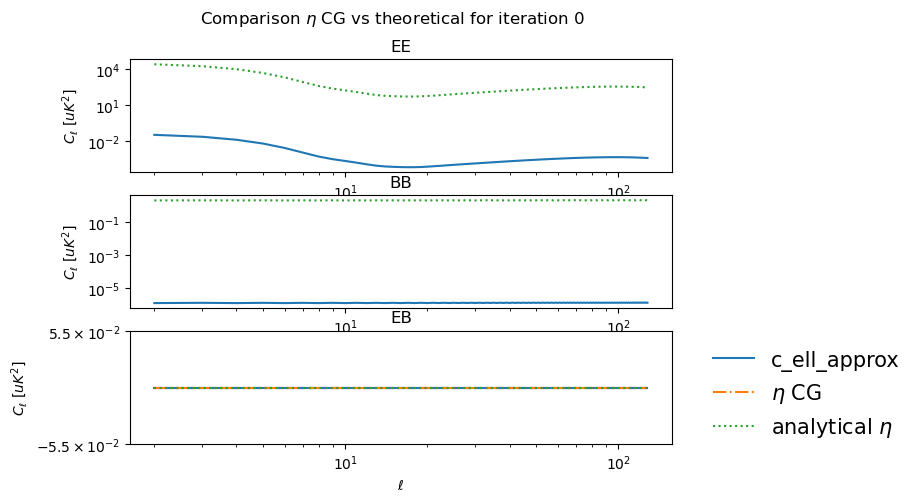

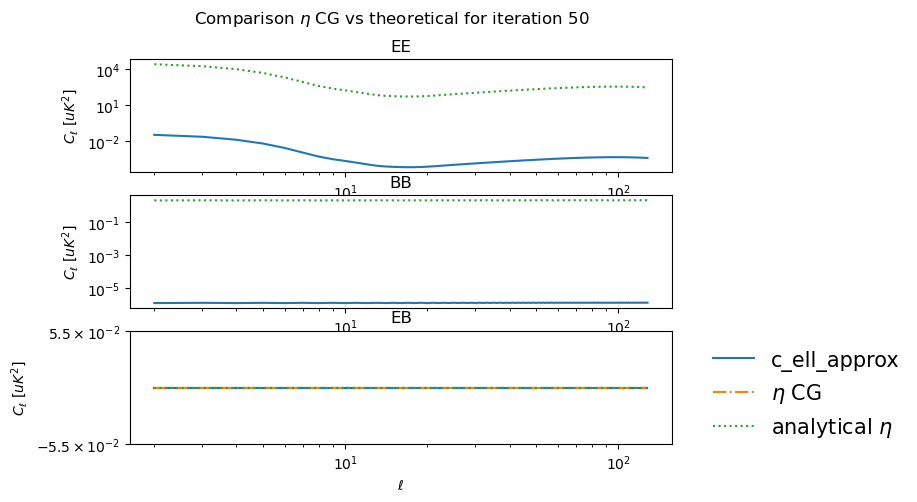

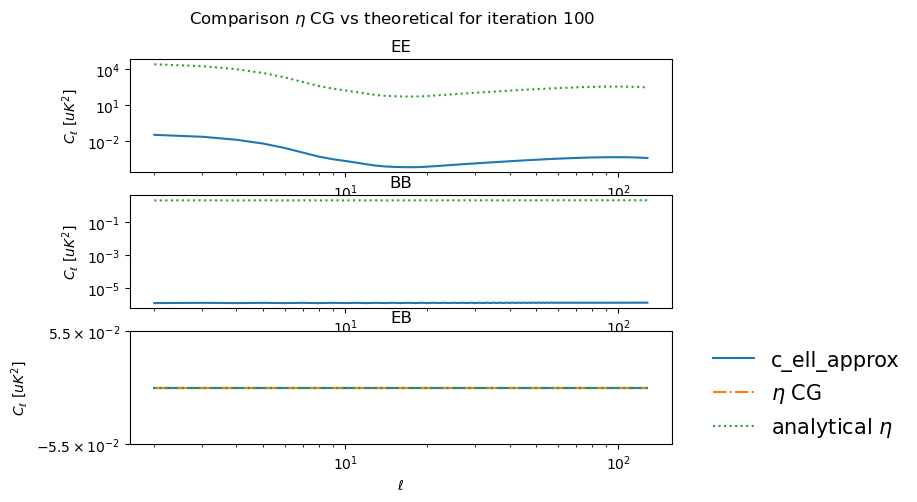

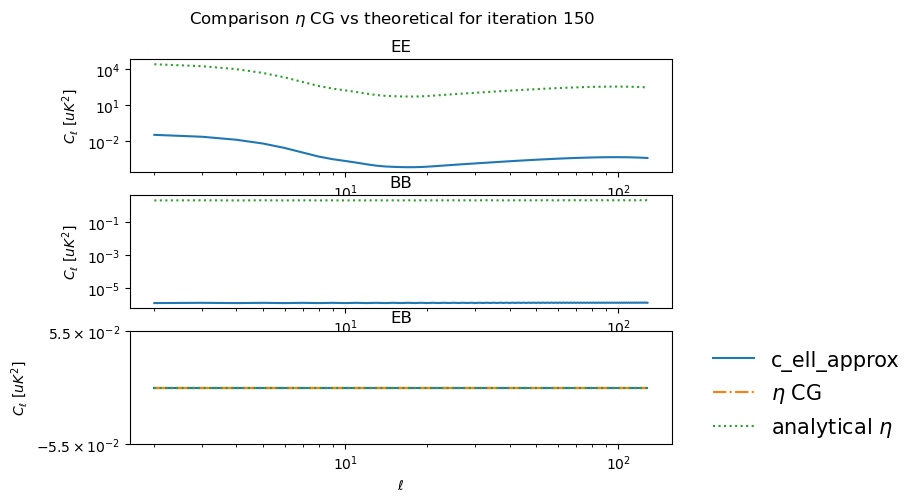

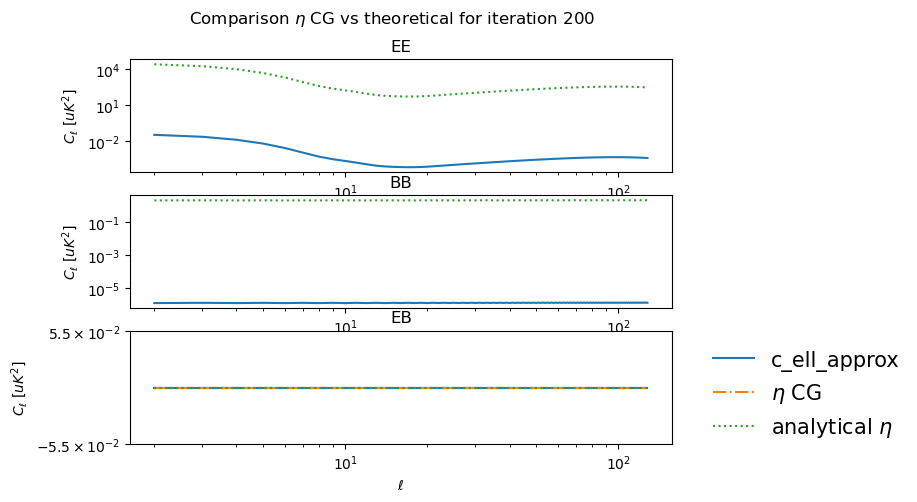

...

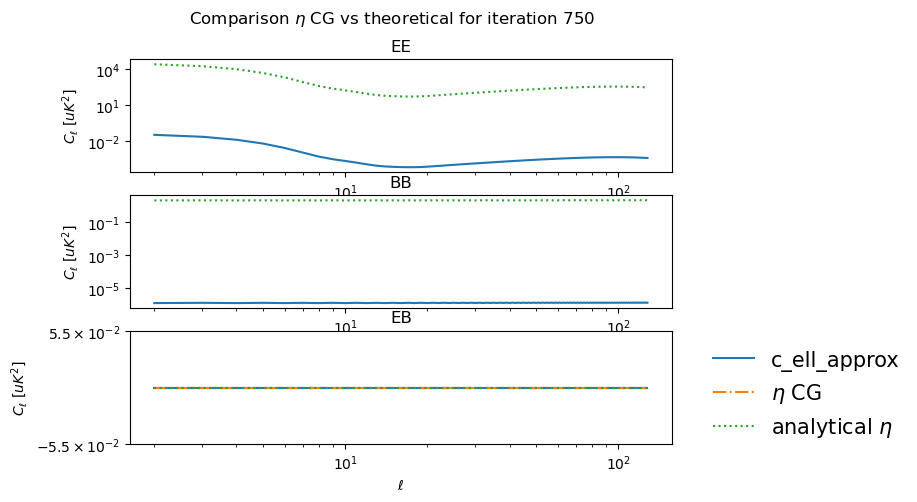

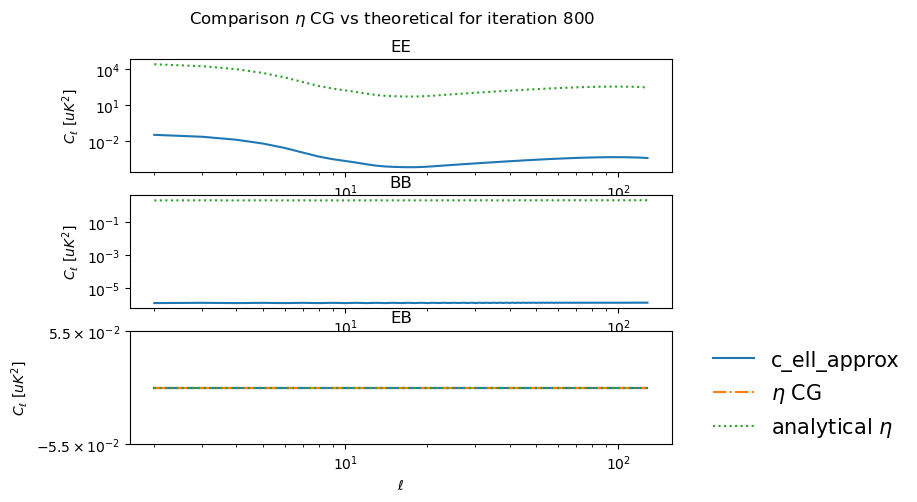

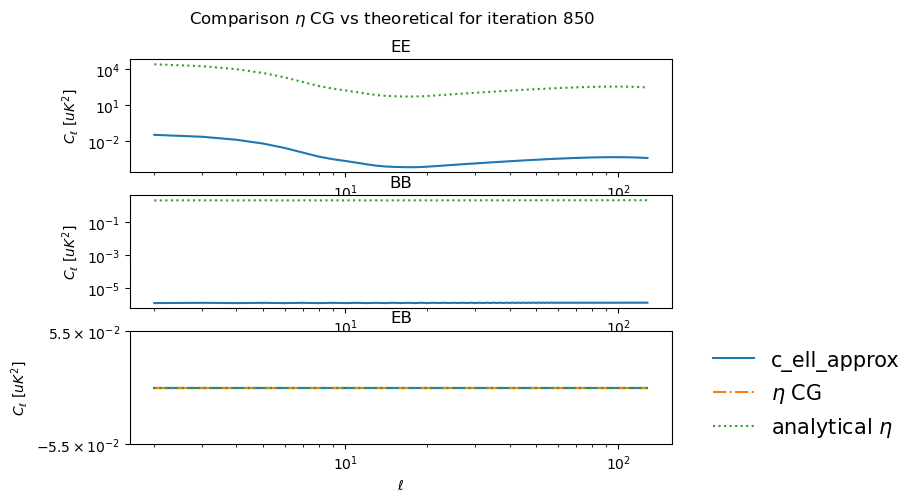

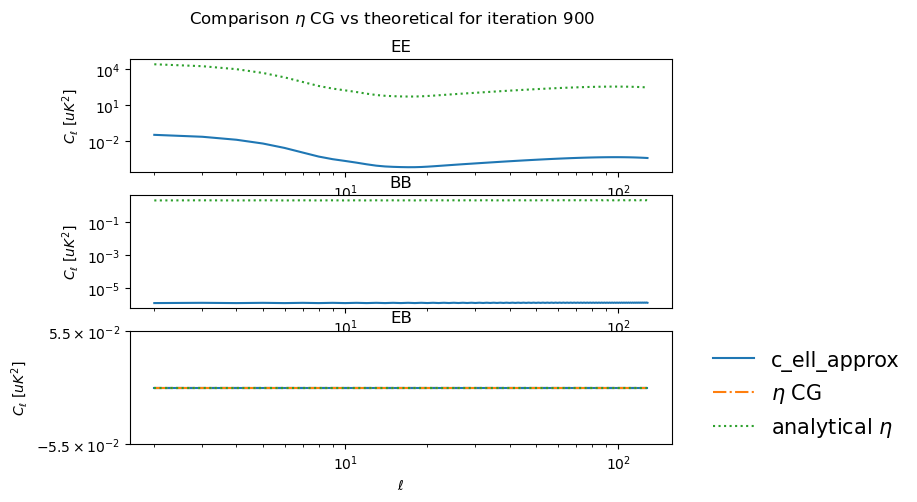

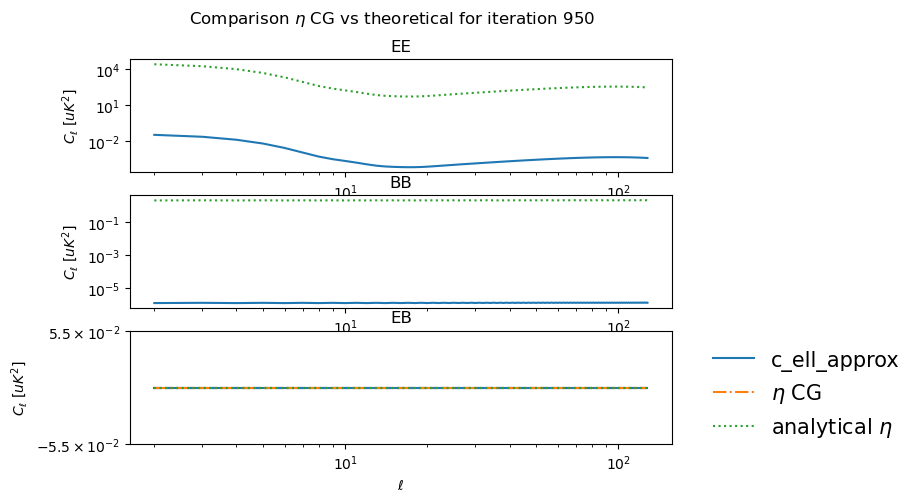

In [16]:
# list_correl = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
list_correl = ['EE', 'BB', 'EB']

ell_arange = np.arange(red_cov_approx_matrix.shape[0]) + MICMAC_sampler_obj.lmin

red_cl_noise_harm = np.zeros_like(red_cov_approx_matrix)

for iteration in range(0,MICMAC_sampler_obj.number_iterations_sampling,sub_step_sampling):
    covariance_noise = np.zeros_like(c_ell_approx)

    mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration])
    mixing_matrix_sampled = mixing_matrix_obj.get_B()
    BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
    BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
    BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)

    cl_noise = BtinvNB[0,0]*hp.nside2resol(MICMAC_sampler_obj.nside)**2
    red_cl_noise_harm[:] = np.diag([cl_noise,cl_noise])
    full_cl_noise = np.zeros_like(c_ell_approx)
    full_cl_noise[:MICMAC_sampler_obj.nstokes,MICMAC_sampler_obj.lmin:] = cl_noise

    # analytical_eta_term_cov = np.einsum('lij,ljk,lkm->lim', red_cov_approx_matrix_sqrt, np.linalg.pinv(red_cov_approx_matrix) + eye_Stokes_personalized/BtinvNB[0,0], red_cov_approx_matrix_sqrt)
    analytical_eta_term_cov = np.einsum('lij,ljk,lkm->lim', red_cov_approx_matrix_sqrt, np.linalg.pinv(red_cov_approx_matrix) + np.linalg.pinv(red_cl_noise_harm), red_cov_approx_matrix_sqrt)

    # analytical_eta_term = np.zeros_like(c_ell_approx)
    analytical_eta_term = micmac.get_c_ells_from_red_covariance_matrix(analytical_eta_term_cov)#[:,lmin:]



    eta_maps_extended = np.vstack([np.zeros_like(all_eta_maps[iteration,0,...]), all_eta_maps[iteration]])
    c_ells_eta = hp.anafast(eta_maps_extended, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar,MICMAC_sampler_obj.lmin:]

    plt.figure(figsize=(7,5))
    plt.suptitle(r"Comparison $\eta$ CG vs theoretical for iteration {}".format(iteration))

    for j in range(number_correl_to_plot):
        ax = plt.subplot(311+j)
        plt.title(list_correl[j])
        
        plt.plot([ell_arange[0], ell_arange[-1]], [0,0], '--', color='black')
        
        plt.plot(ell_arange, c_ell_approx[j,MICMAC_sampler_obj.lmin:], label='c_ell_approx')
        # plt.plot(ell_arange, full_cl_noise[j,MICMAC_sampler_obj.lmin:], label='c_ell N_c')
        plt.plot(ell_arange, c_ells_eta[j,:], '-.', label=r"$\eta$ CG")
        
        plt.plot(ell_arange, analytical_eta_term[j,:], ':', label=r"analytical $\eta$")

        if MICMAC_sampler_obj.nstokes == 3 and j < number_correl_to_plot-2:
            plt.xticks(color='w')

        if j <= MICMAC_sampler_obj.nstokes-1:
            plt.loglog()
            # plt.ylim(ymin=noise_level/10.)
        else:
            plt.xscale('log')
            plt.yscale('symlog')
        # plt.legend()
        if j == position_legend:
            plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left", prop={'size': 15}, frameon=False)
        
        plt.ylabel("$C_\ell$ [$uK^2$]")
        if j == number_correl_to_plot-1:
            plt.xlabel(r"$\ell$")


    plt.show()

# Validation $s_c$

In [17]:
all_params_mixing_matrix_samples[0].ravel(order='F').reshape((4,2),order='F')

array([[0.33858815, 0.00979233],
       [0.02963068, 0.05147511],
       [0.00998213, 0.12913911],
       [0.00328725, 0.44076761]])

In [18]:
# [[0.33858815 0.00979233]
#  [0.02963068 0.05147511]
#  [0.00998213 0.12913911]
#  [0.00328725 0.44076761]]

In [19]:
initial_freq_maps.shape

(6, 2, 49152)

/Users/mag/miniconda3/envs/non_param_silver/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 
  fig.canvas.print_figure(bytes_io, **kw)


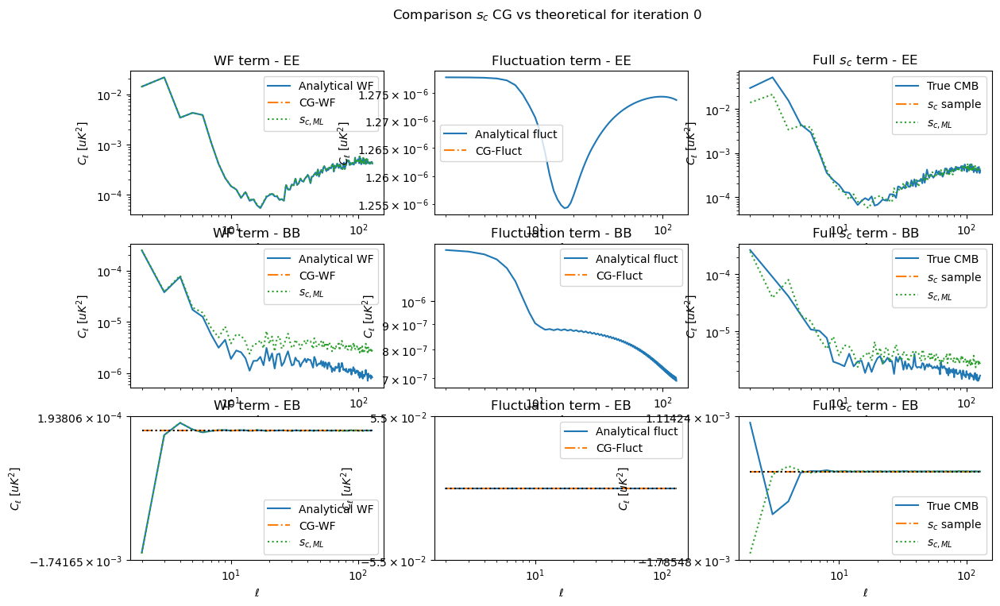

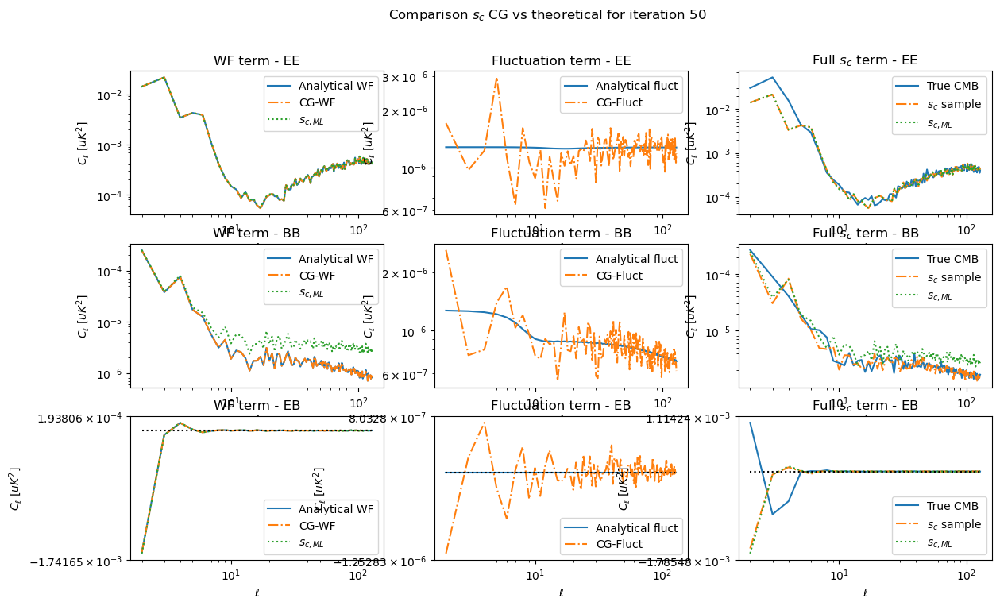

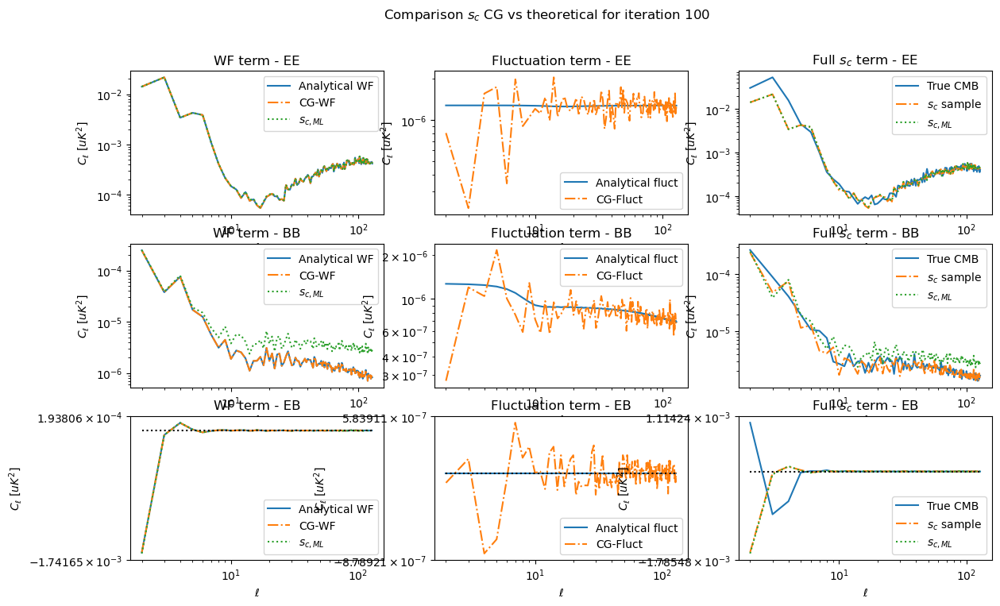

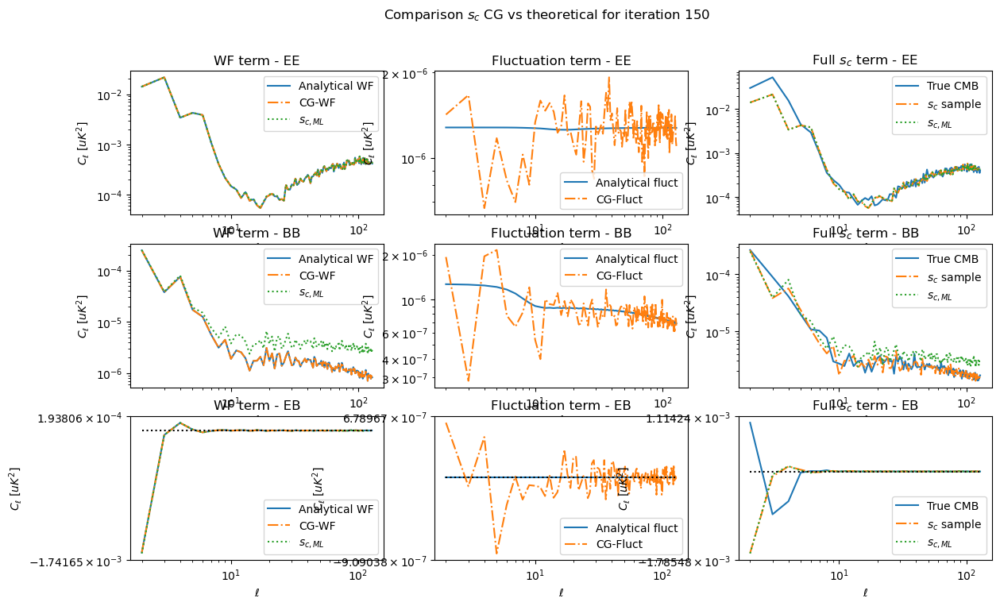

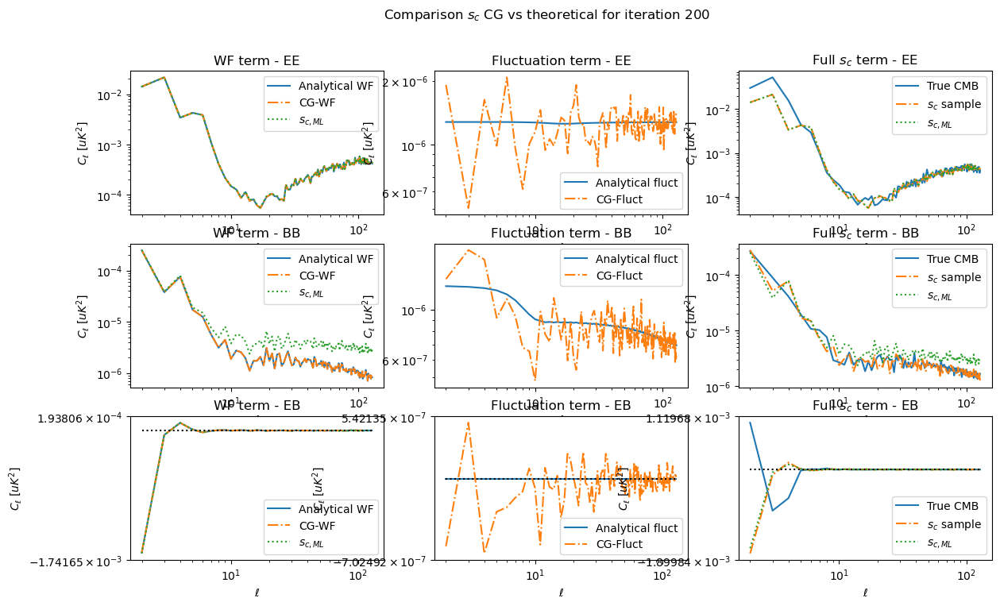

...

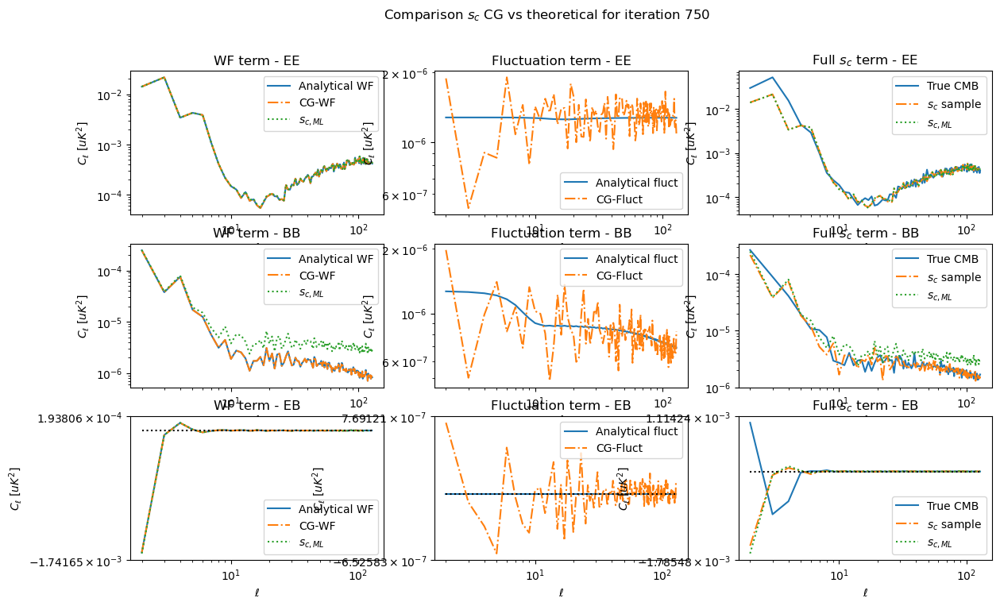

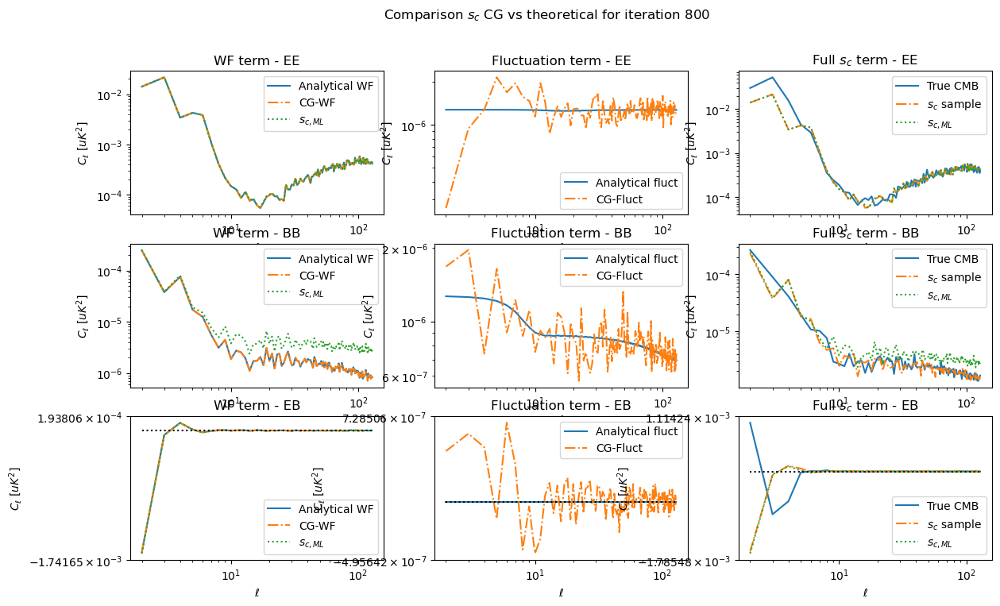

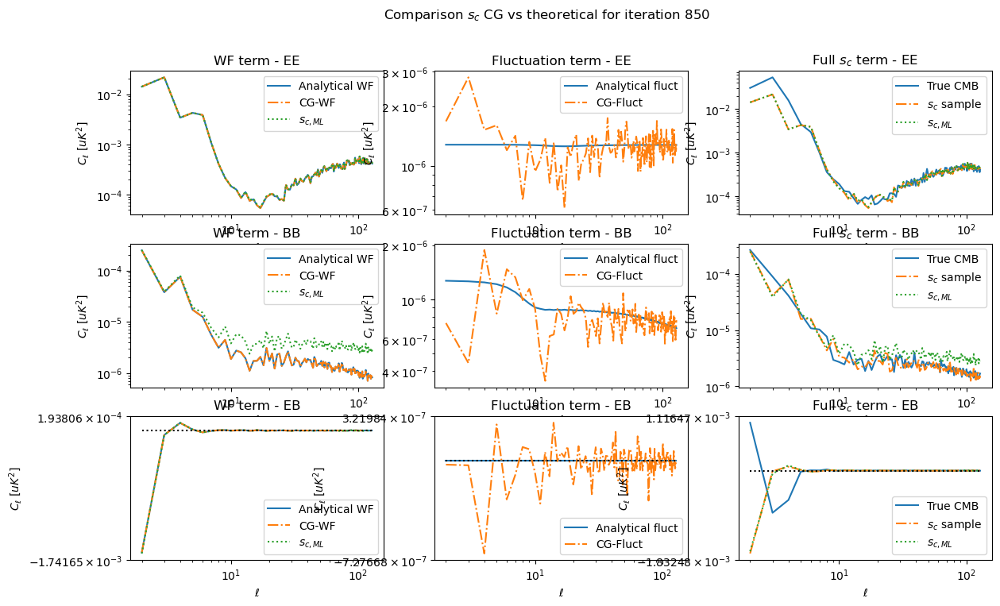

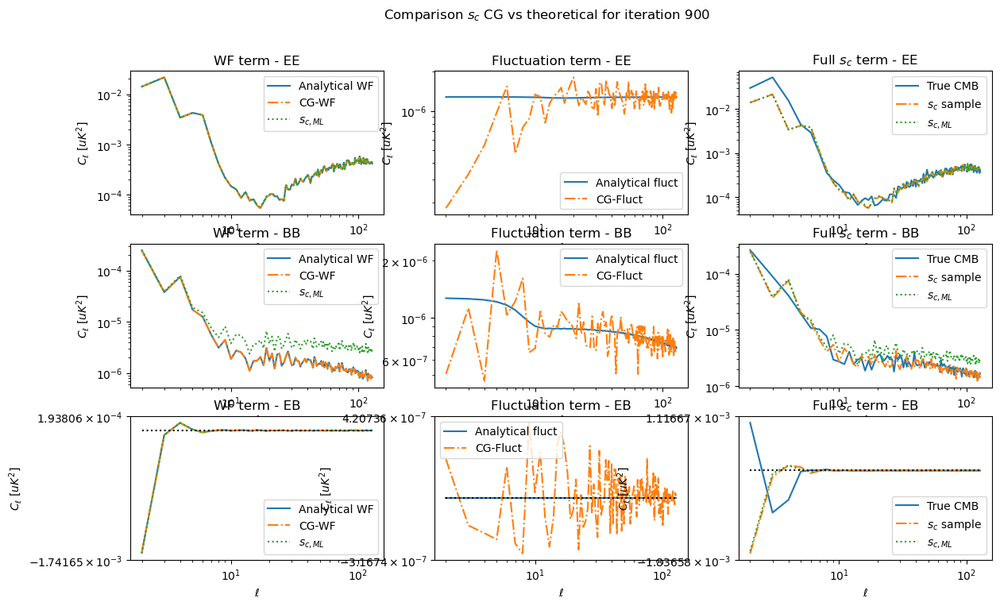

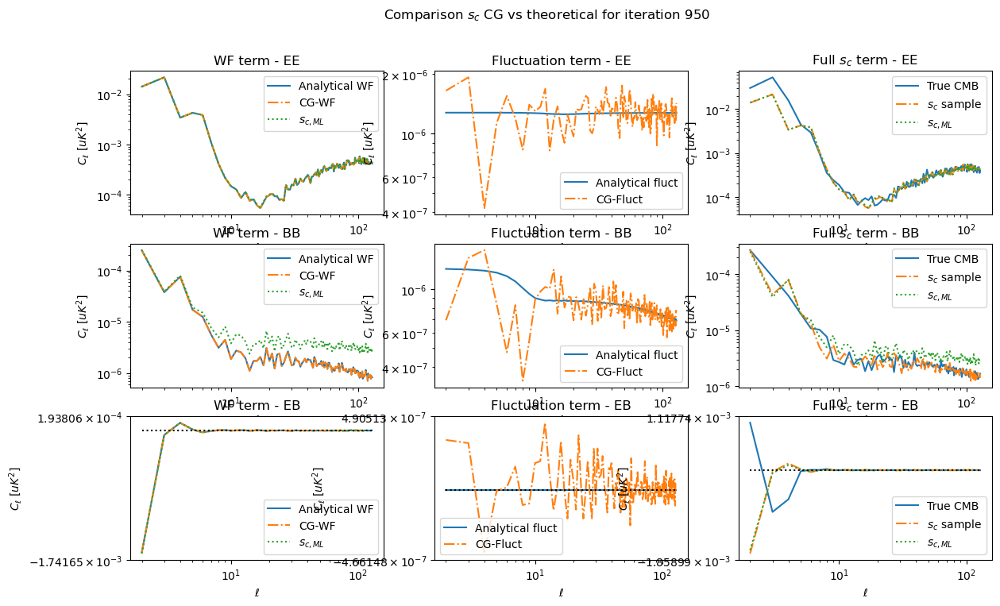

In [20]:
# list_correl = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
list_correl = ['EE', 'BB', 'EB']
# overrelaxation_param = -.89

map_true_CMB_ext = np.vstack([np.zeros_like(input_cmb_maps[0,0,...]), input_cmb_maps[0]])
c_ell_true_CMB = hp.anafast(map_true_CMB_ext, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar, MICMAC_sampler_obj.lmin:]

ell_arange = np.arange(red_cov_approx_matrix.shape[0]) + MICMAC_sampler_obj.lmin

for iteration in range(0,MICMAC_sampler_obj.number_iterations_sampling,sub_step_sampling):
    covariance_noise = np.zeros_like(c_ell_approx)

    

    red_cov_matrix = micmac.get_reduced_matrix_from_c_ell(all_cell_samples[iteration,...])#[MICMAC_sampler_obj.lmin:]
    mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration])
    if iteration != 0:
        red_cov_matrix = micmac.get_reduced_matrix_from_c_ell(all_cell_samples[iteration-1,...])#[MICMAC_sampler_obj.lmin:]
        mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration-1])
    mixing_matrix_sampled = mixing_matrix_obj.get_B()
    BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
    BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
    BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)
    s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps, jax_use=False)[0, :, :]


    _cl_noise_harm = micmac.get_Cl_noise(np.array(instrument['depth_p']), mixing_matrix_sampled, lmax)[0,0,lmin:]
    red_cl_noise_harm = micmac.get_reduced_matrix_from_c_ell(np.array([_cl_noise_harm,_cl_noise_harm,np.zeros_like(_cl_noise_harm)]))
    cl_noise_harm = micmac.get_c_ells_from_red_covariance_matrix(red_cl_noise_harm)

    analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + np.linalg.pinv(red_cl_noise_harm))
    # analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + eye_Stokes_only_B/BtinvNB[0,0])
    analytical_WF_map = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(s_cML/BtinvNB[0,0]/hp.nside2resol(MICMAC_sampler_obj.nside)**2,
                                                                        analytical_WF_harm, lmin=lmin, n_iter=n_iter)


    full_map_s_c = all_s_c_WF_maps[iteration] + all_s_c_fluct_maps[iteration]
    full_map_s_cML_extended = np.vstack([np.zeros_like(s_cML[0,...]), s_cML])
    c_ell_s_cML = hp.anafast(full_map_s_cML_extended, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar,MICMAC_sampler_obj.lmin:]

    # analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + np.eye(nstokes)/BtinvNB[0,0])
    # analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + eye_Stokes_personalized/BtinvNB[0,0])
    # analytical_WF_map = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(s_cML/BtinvNB[0,0], analytical_WF_harm, lmin=MICMAC_sampler_obj.lmin, n_iter=MICMAC_sampler_obj.n_iter)

    analytical_WF_map_ext = np.vstack([np.zeros_like(analytical_WF_map[0]),analytical_WF_map])
    analytical_WF_cells = hp.anafast(analytical_WF_map_ext, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar,MICMAC_sampler_obj.lmin:]
    analytical_fluct_c_ell = micmac.get_c_ells_from_red_covariance_matrix(analytical_WF_harm.copy())#[indices_polar,lmin:]

    s_c_WF_maps_extended = np.vstack([np.zeros_like(all_s_c_WF_maps[iteration,0,...]), all_s_c_WF_maps[iteration]])
    c_ells_s_c_WF = hp.anafast(s_c_WF_maps_extended, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar,MICMAC_sampler_obj.lmin:]

    s_c_fluct_maps_extended = np.vstack([np.zeros_like(all_s_c_fluct_maps[iteration,0,...]), all_s_c_fluct_maps[iteration]])
    c_ells_s_c_fluct = hp.anafast(s_c_fluct_maps_extended, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar,MICMAC_sampler_obj.lmin:]

    # s_c_recovered = all_s_c_WF_maps[iteration,...] + np.sqrt(1-overrelaxation_param**2)*all_s_c_fluct_maps[iteration,...] + overrelaxation_param*(s_c_recovered-all_s_c_WF_maps[iteration,...])
    s_c_recovered = all_s_c_WF_maps[iteration,...] + all_s_c_fluct_maps[iteration,...]
    s_c_recovered_ext = np.vstack([np.zeros_like(s_c_recovered[0]),s_c_recovered])
    c_ells_s_c = hp.anafast(s_c_recovered_ext, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar,MICMAC_sampler_obj.lmin:]

    plt.figure(figsize=(14,8))
    plt.suptitle(r"Comparison $s_c$ CG vs theoretical for iteration {}".format(iteration))

    for j in range(number_correl_to_plot):
        plt.subplot(331+3*j)
        plt.plot(np.arange(c_ells_s_c_WF.shape[-1])+MICMAC_sampler_obj.lmin, analytical_WF_cells[j,:], label='Analytical WF')
        plt.plot(np.arange(c_ells_s_c_WF.shape[-1])+MICMAC_sampler_obj.lmin, c_ells_s_c_WF[j,:], '-.', label='CG-WF')
        plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, c_ell_s_cML[j,:], ':', label='$s_{c,ML}$')
        if j <= MICMAC_sampler_obj.nstokes-1:
            plt.loglog()
        else:
            plt.xscale('log')
            plt.yscale('symlog')
            plt.plot([MICMAC_sampler_obj.lmin,MICMAC_sampler_obj.lmax+1], [0,0], 'k:')
        plt.title('WF term - {}'.format(list_correl[j]))
        plt.ylabel("$C_\ell$ [$uK^2$]")
        plt.xlabel(r"$\ell$")
        plt.legend()

        plt.subplot(332+3*j)
        plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, analytical_fluct_c_ell[j,:], label='Analytical fluct')
        plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, c_ells_s_c_fluct[j,:], '-.', label='CG-Fluct')

        if j <= MICMAC_sampler_obj.nstokes-1:
            plt.loglog()
        else:
            plt.xscale('log')
            plt.yscale('symlog')
            plt.plot([MICMAC_sampler_obj.lmin,MICMAC_sampler_obj.lmax+1], [0,0], 'k:')
        plt.title('Fluctuation term - {}'.format(list_correl[j]))
        plt.ylabel("$C_\ell$ [$uK^2$]")
        plt.xlabel(r"$\ell$")
        plt.legend()
        
        plt.subplot(333+3*j)
        plt.plot(np.arange(c_ells_s_c_WF.shape[-1])+MICMAC_sampler_obj.lmin, c_ell_true_CMB[j,:], label='True CMB')
        plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, c_ells_s_c[j,:], '-.', label='$s_c$ sample')
        plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, c_ell_s_cML[j,:], ':', label='$s_{c,ML}$')

        if j <= MICMAC_sampler_obj.nstokes-1:
            plt.loglog()
            plt.plot([MICMAC_sampler_obj.lmin,MICMAC_sampler_obj.lmax+1], [0,0], 'k:')
        else:
            plt.xscale('log')
            plt.yscale('symlog')
            plt.plot([MICMAC_sampler_obj.lmin,MICMAC_sampler_obj.lmax+1], [0,0], 'k:')
        plt.title('Full $s_c$ term - {}'.format(list_correl[j]))
        plt.ylabel("$C_\ell$ [$uK^2$]")
        
        plt.xlabel(r"$\ell$")
        plt.legend()


    plt.show()

In [21]:
mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[0])
mixing_matrix_sampled = mixing_matrix_obj.get_B()
micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps, jax_use=False)[0]

array([[-0.28724001,  0.10086427, -0.39043695, ..., -0.85950351,
         0.34611906,  0.27945064],
       [-0.88810407,  0.14540208,  0.56445836, ..., -0.40791829,
        -0.02918896,  0.35523968]])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


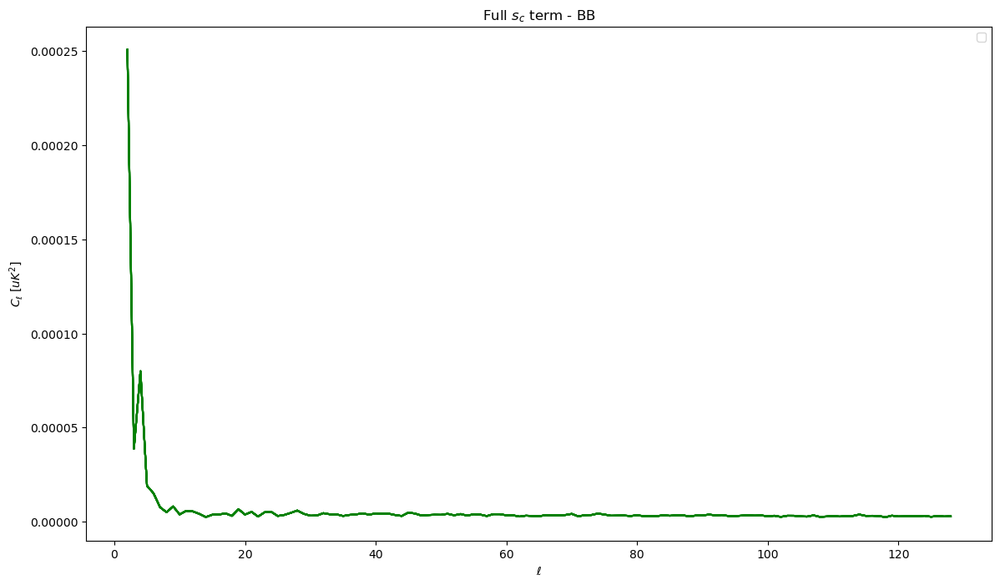

In [22]:
# list_correl = ['TT', 'EE', 'BB', 'TE', 'EB', 'TB']
list_correl = ['EE', 'BB', 'EB']
# overrelaxation_param = -.89

map_true_CMB_ext = np.vstack([np.zeros_like(input_cmb_maps[0,0,...]), input_cmb_maps[0]])
c_ell_true_CMB = hp.anafast(map_true_CMB_ext, lmax=MICMAC_sampler_obj.lmax, iter=MICMAC_sampler_obj.n_iter)[indices_polar, MICMAC_sampler_obj.lmin:]

ell_arange = np.arange(red_cov_approx_matrix.shape[0]) + MICMAC_sampler_obj.lmin

plt.figure(figsize=(14,8))
for iteration in range(0,MICMAC_sampler_obj.number_iterations_sampling,sub_step_sampling):
    covariance_noise = np.zeros_like(c_ell_approx)

    red_cov_matrix = micmac.get_reduced_matrix_from_c_ell(all_cell_samples[iteration,...])[MICMAC_sampler_obj.lmin:]
    mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration])
    if iteration != 0:
        red_cov_matrix = micmac.get_reduced_matrix_from_c_ell(all_cell_samples[iteration-1,...])[MICMAC_sampler_obj.lmin:]
        mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration-1])
    mixing_matrix_sampled = mixing_matrix_obj.get_B()
    BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
    BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
    BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)
    s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps, jax_use=False)[0, :, :]

    full_map_s_c = all_s_c_WF_maps[iteration] + all_s_c_fluct_maps[iteration]
    full_map_s_cML_extended = np.vstack([np.zeros_like(s_cML[0,...]), s_cML])
    c_ell_s_cML = hp.anafast(full_map_s_cML_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

    # analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + np.eye(nstokes)/BtinvNB[0,0])
    analytical_WF_harm = np.linalg.pinv(np.linalg.pinv(red_cov_matrix) + eye_Stokes_personalized/BtinvNB[0,0])
    analytical_WF_map = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(s_cML/BtinvNB[0,0], analytical_WF_harm, lmin=lmin, n_iter=n_iter)

    analytical_WF_map_ext = np.vstack([np.zeros_like(analytical_WF_map[0]),analytical_WF_map])
    analytical_WF_cells = hp.anafast(analytical_WF_map_ext, lmax=lmax, iter=n_iter)[indices_polar,lmin:]
    analytical_fluct_c_ell = micmac.get_c_ells_from_red_covariance_matrix(analytical_WF_harm.copy())#[indices_polar,lmin:]

    s_c_WF_maps_extended = np.vstack([np.zeros_like(all_s_c_WF_maps[iteration,0,...]), all_s_c_WF_maps[iteration]])
    c_ells_s_c_WF = hp.anafast(s_c_WF_maps_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

    s_c_fluct_maps_extended = np.vstack([np.zeros_like(all_s_c_fluct_maps[iteration,0,...]), all_s_c_fluct_maps[iteration]])
    c_ells_s_c_fluct = hp.anafast(s_c_fluct_maps_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

    # s_c_recovered = all_s_c_WF_maps[iteration,...] + np.sqrt(1-overrelaxation_param**2)*all_s_c_fluct_maps[iteration,...] + overrelaxation_param*(s_c_recovered-all_s_c_WF_maps[iteration,...])
    s_c_recovered = all_s_c_WF_maps[iteration,...] + all_s_c_fluct_maps[iteration,...]
    s_c_recovered_ext = np.vstack([np.zeros_like(s_c_recovered[0]),s_c_recovered])
    c_ells_s_c = hp.anafast(s_c_recovered_ext, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

    # plt.figure(figsize=(14,8))
    # plt.suptitle(r"Comparison $s_c$ CG vs theoretical for iteration {}".format(iteration))

    # for j in range(number_correl_to_plot):
        # plt.plot(np.arange(c_ells_s_c_WF.shape[-1])+lmin, c_ell_true_CMB[j,:], label='True CMB')
        # plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+lmin, c_ells_s_c[j,:], '-.', label='$s_c$ sample')
    plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+lmin, c_ell_s_cML[1,:], 'g', alpha=.5)

# if j <= nstokes-1:
#     plt.loglog()
#     plt.plot([lmin,lmax+1], [0,0], 'k:')
# else:
#     plt.xscale('log')
#     plt.yscale('symlog')
#     plt.plot([lmin,lmax+1], [0,0], 'k:')
plt.title('Full $s_c$ term - {}'.format(list_correl[1]))
plt.ylabel("$C_\ell$ [$uK^2$]")

plt.xlabel(r"$\ell$")
plt.legend()


plt.show()

# Plot $C$

In [23]:
map_true_CMB_ext = np.vstack([np.zeros_like(input_cmb_maps[0,0,...]), input_cmb_maps[0]])
c_ell_true_CMB = hp.anafast(map_true_CMB_ext, lmax=lmax, iter=n_iter)[indices_polar, lmin:]

In [24]:
# list_correl = ['EE', 'BB', 'EB']

# ell_arange = np.arange(red_cov_approx_matrix.shape[0]) + lmin
# min_value_mean = 3
# factor_mean = (2*ell_arange[min_value_mean:] + 1)/(2*ell_arange[min_value_mean:] + 1 - 2 - 2*nstokes)

# for iteration in range(0,number_iterations_sampling,sub_step_sampling):
#     covariance_noise = np.zeros_like(c_ell_approx)

#     mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration])
#     mixing_matrix_sampled = mixing_matrix_obj.get_B()
#     BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
#     BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
#     BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)
#     s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps, jax_use=False)[0]
#     full_map_s_c = all_s_c_WF_maps[iteration] + all_s_c_fluct_maps[iteration]
#     # red_cov_matrix = micmac.get_reduced_matrix_from_c_ell(all_cell_samples[iteration,...])[lmin:]

#     full_map_s_cML_extended = np.vstack([np.zeros_like(s_cML[0,...]), s_cML])
#     c_ell_s_cML = hp.anafast(full_map_s_cML_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

#     full_map_s_c_extended = np.vstack([np.zeros_like(full_map_s_c[0,...]), full_map_s_c])
#     c_ell_s_c = hp.anafast(full_map_s_c_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

#     plt.figure(figsize=(10,5))
#     plt.suptitle(r"Little study $C$ for iteration {}".format(iteration))

#     for j in range(number_correl_to_plot):
#         ax = plt.subplot(311+j)
#         plt.title(list_correl[j])

#         plt.plot(ell_arange[min_value_mean:], c_ell_s_c[j,min_value_mean:]*factor_mean, label='Mean value invWishart')
#         plt.plot(ell_arange, c_ell_s_cML[j,...], label='$s_{c,ML}$')
#         plt.plot(ell_arange, all_cell_samples[iteration,j,lmin:], '--', label='Sample C')
#         plt.plot(ell_arange, c_ell_true_CMB[j,...], ':', label='True CMB')
        
#         plt.ylabel("$C_\ell$ [$uK^2$]")
#         if j == number_correl_to_plot-1:
#             plt.xlabel(r"$\ell$")
#             plt.legend()
#             plt.xscale('log')
#             plt.yscale('symlog')
#         else:
#             plt.loglog()


#     plt.show()

In [25]:
# all_r_samples_2 = np.copy(all_r_samples)

In [26]:
# all_r_samples = np.zeros(MICMAC_sampler_obj.number_iterations_sampling+1)
# all_r_samples[0] = all_r_samples_2[0]
# all_r_samples[1:] = all_r_samples_2[9:]
# all_r_samples

# Studying $r$

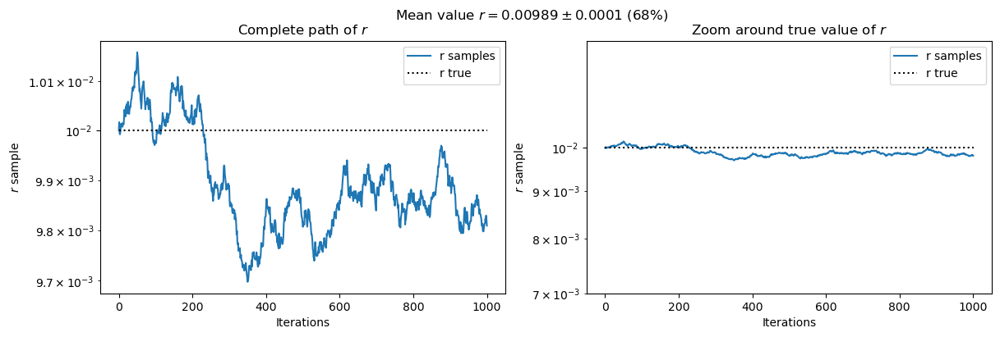

In [31]:
plt.figure(figsize=(14,4))
mean_r = np.round(all_r_samples.mean(), decimals=5)
std_r = np.round(all_r_samples.std(), decimals=5)
plt.suptitle(f"Mean value $r = {mean_r} \pm {std_r}$ (68%)")
plt.subplot(121)
plt.plot(np.arange(MICMAC_sampler_obj.number_iterations_sampling+1), all_r_samples, label='r samples')
plt.plot([0, MICMAC_sampler_obj.number_iterations_sampling+1], [MICMAC_sampler_obj.r_true,MICMAC_sampler_obj.r_true], 'k:', label='r true')
plt.yscale('log')
plt.xlabel("Iterations")
plt.ylabel('$r$ sample')
plt.title('Complete path of $r$')
plt.legend()

plt.subplot(122)
plt.plot(np.arange(MICMAC_sampler_obj.number_iterations_sampling+1), all_r_samples, label='r samples')
plt.plot([0, MICMAC_sampler_obj.number_iterations_sampling+1], [MICMAC_sampler_obj.r_true,MICMAC_sampler_obj.r_true], 'k:', label='r true')
plt.yscale('log')
plt.xlabel("Iterations")
plt.ylabel('$r$ sample')
plt.title('Zoom around true value of $r$')
plt.legend()
plt.ylim(ymin=MICMAC_sampler_obj.r_true*.7, ymax=MICMAC_sampler_obj.r_true*1.3)
plt.show()

In [32]:
# initial_freq_maps_only_B = np.copy(initial_freq_maps)
# c_ell_select_only_Bmodes = np.zeros((6,lmax+1))
# c_ell_select_only_Bmodes[2,lmin:] = 1
# red_cov_select_Bmodes = micmac.get_reduced_matrix_from_c_ell(c_ell_select_only_Bmodes[indices_polar,...])[lmin:,...]
# for freq in range(number_frequencies):
#     initial_freq_maps_only_B[freq] = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(np.copy(initial_freq_maps[freq]), red_cov_select_Bmodes, lmin=2, n_iter=n_iter)[1:,...]

# input_cmb_maps_only_B = micmac.maps_x_reduced_matrix_generalized_sqrt_sqrt(np.copy(input_cmb_maps[0]), red_cov_select_Bmodes, lmin=2, n_iter=n_iter)[1:,...]

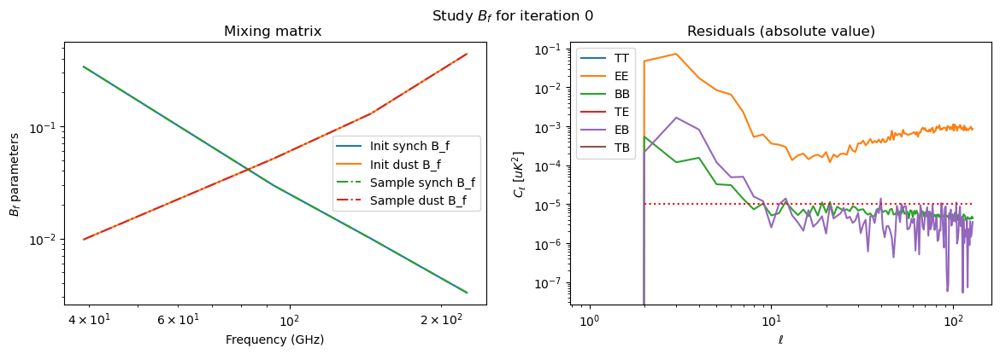

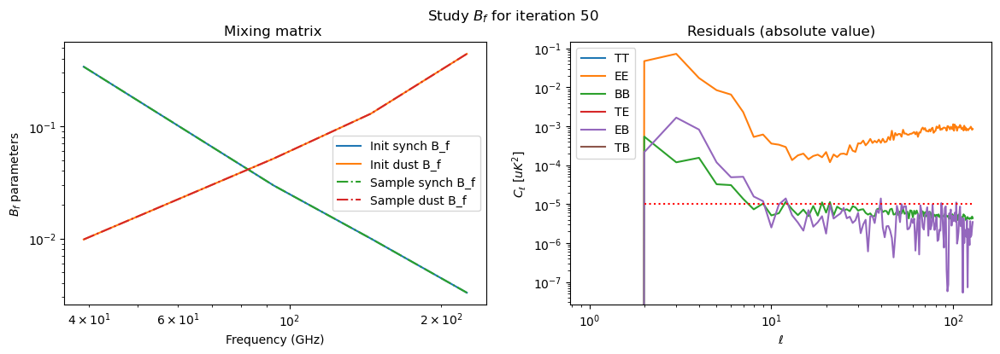

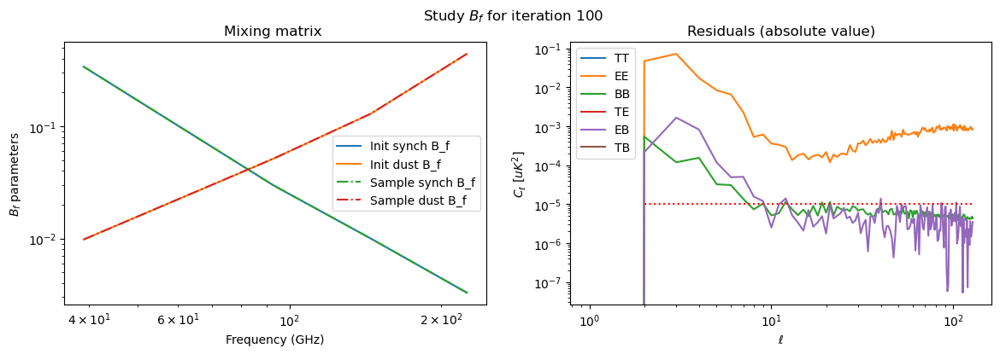

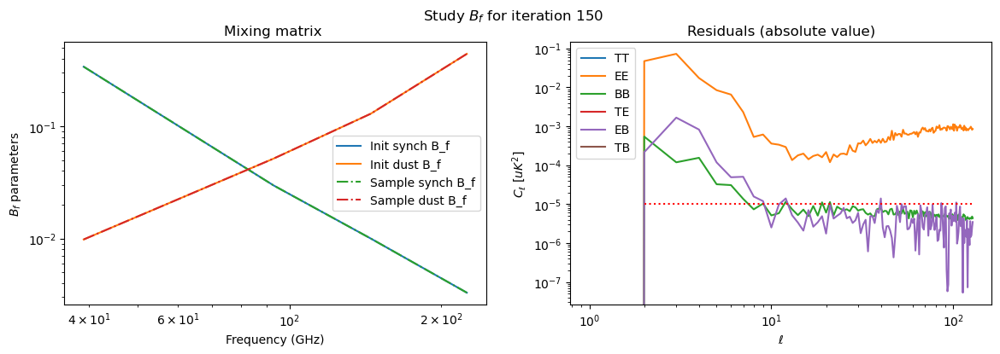

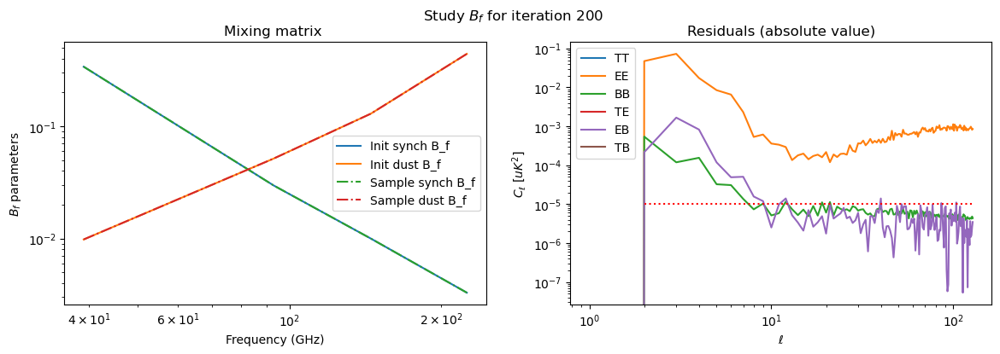

...

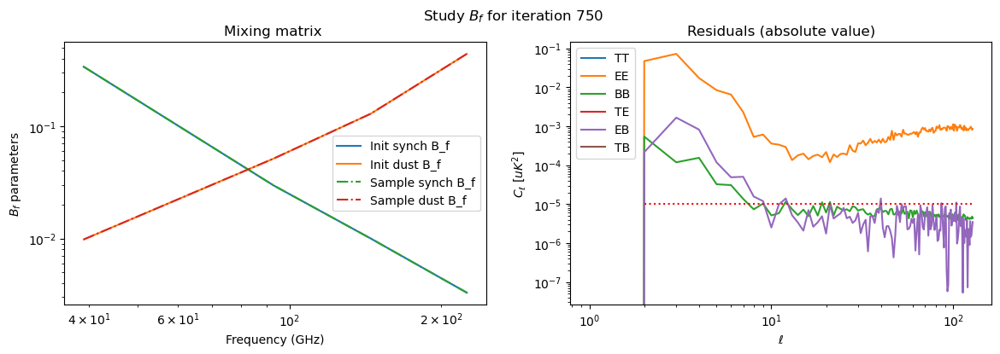

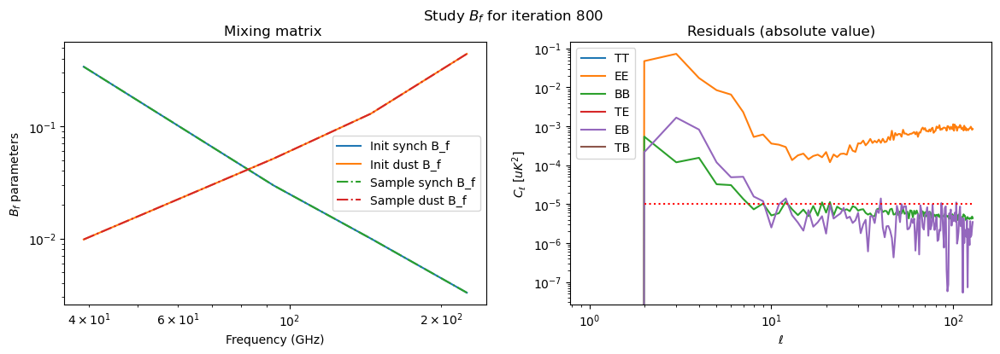

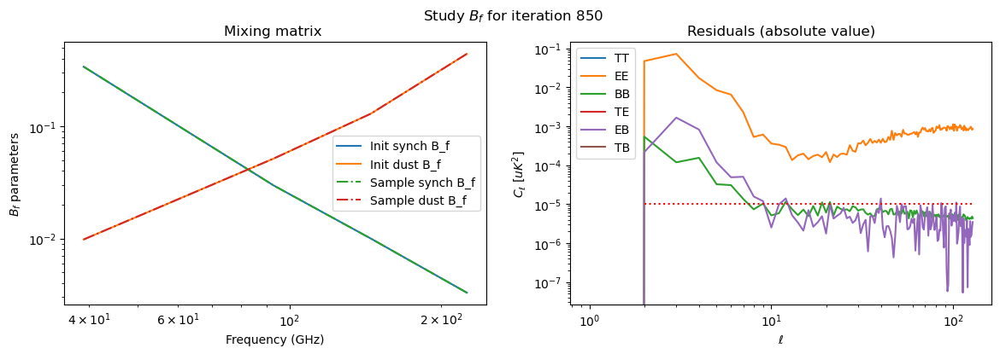

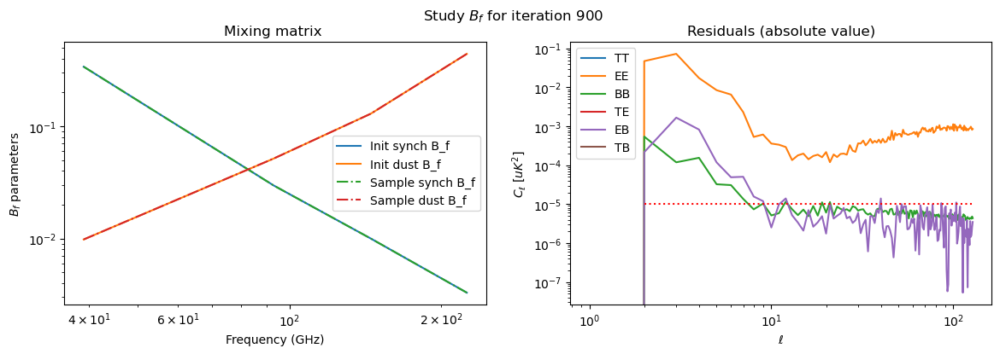

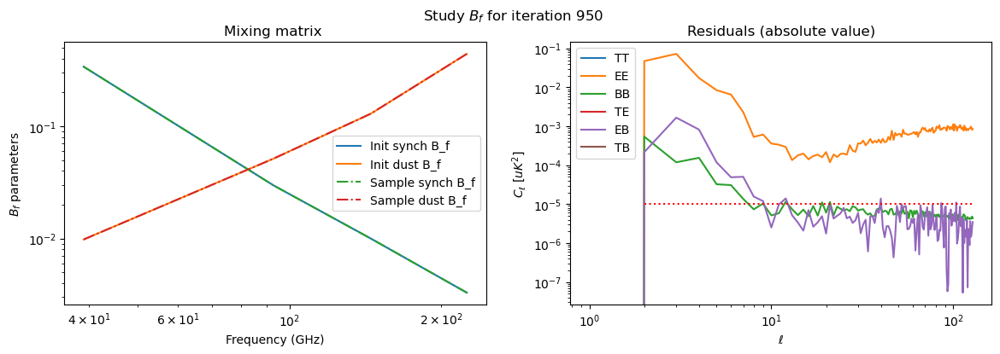

In [43]:
list_correl = ['EE', 'BB', 'EB']

ell_arange = np.arange(red_cov_approx_matrix.shape[0]) + lmin
min_value_mean = 3
factor_mean = (2*ell_arange[min_value_mean:] + 1)/(2*ell_arange[min_value_mean:] + 1 - 2 - 2*nstokes)

frequency_Bf = instrument['frequency'][1:-1]

for iteration in range(0,MICMAC_sampler_obj.number_iterations_sampling,sub_step_sampling):
    covariance_noise = np.zeros_like(c_ell_approx)

    mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration])
    mixing_matrix_sampled = mixing_matrix_obj.get_B()
    BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
    BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
    BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)
    s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps, jax_use=False)[0]
    # s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps_only_B, jax_use=False)[0]

    full_map_s_cML_extended = np.vstack([np.zeros_like(s_cML[0,...]), s_cML])
    c_ell_s_cML = hp.anafast(full_map_s_cML_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

    first_residual = input_cmb_maps[0] - s_cML
    # first_residual = input_cmb_maps_only_B - s_cML

    _cl_noise_harm = micmac.get_Cl_noise(np.array(instrument['depth_p']), mixing_matrix_sampled, lmax)[0,0,lmin:]
    red_cl_noise_harm = micmac.get_reduced_matrix_from_c_ell(np.array([_cl_noise_harm,_cl_noise_harm,np.zeros_like(_cl_noise_harm)]))
    cl_noise_harm = micmac.get_c_ells_from_red_covariance_matrix(red_cl_noise_harm)


    c_ell_first_residual = hp.anafast(np.vstack([np.zeros_like(first_residual[0]),first_residual]), lmax=lmax, iter=n_iter)
    ell_arange = np.arange(c_ell_first_residual.shape[1])
    
    plt.figure(figsize=(14,4))
    plt.suptitle(r"Study $B_f$ for iteration {}".format(iteration))

    plt.subplot(121)
    plt.plot(frequency_Bf, init_params[:,0], label='Init synch B_f')
    plt.plot(frequency_Bf, init_params[:,1], label='Init dust B_f')
    plt.plot(frequency_Bf, all_params_mixing_matrix_samples[iteration,:,0], '-.', label='Sample synch B_f')
    plt.plot(frequency_Bf, all_params_mixing_matrix_samples[iteration,:,1], '-.', label='Sample dust B_f')
    plt.title("Mixing matrix ")
    plt.xlabel('Frequency (GHz)')
    plt.ylabel("$B_f$ parameters")
    plt.legend()
    plt.loglog()

    plt.subplot(122)
    plt.plot(ell_arange, np.abs(c_ell_first_residual.T))
    plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, cl_noise_harm[0,:], 'r:', label='noise $N_c$')
    # plt.plot(ell_arange, np.abs(c_ell_first_residual).T)
    plt.title("Residuals (absolute value)")
    plt.ylabel("$C_\ell$ [$uK^2$]")
    plt.xlabel("$\ell$")
    plt.loglog()
    plt.legend(['TT', 'EE', 'BB', 'TE', 'EB', 'TB'])
    

    plt.show()

/var/folders/f8/p6tqlgxj2qn5x_tyjrvc1vnh0000gn/T/ipykernel_91683/3367809103.py:58: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


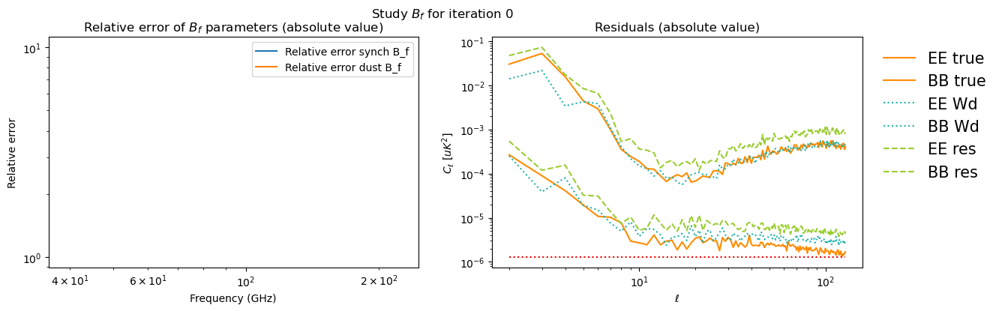

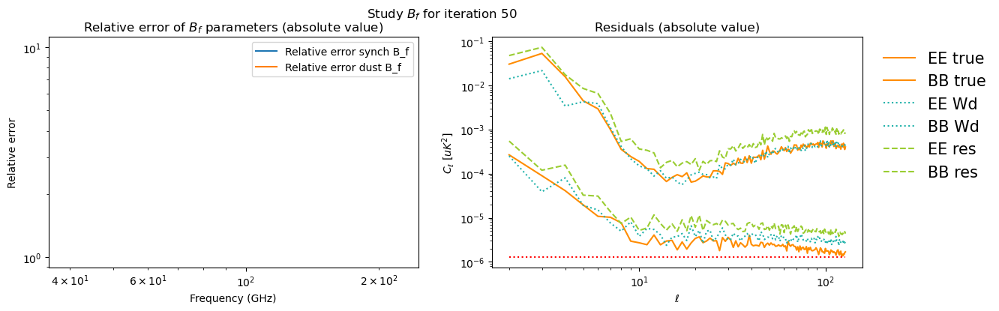

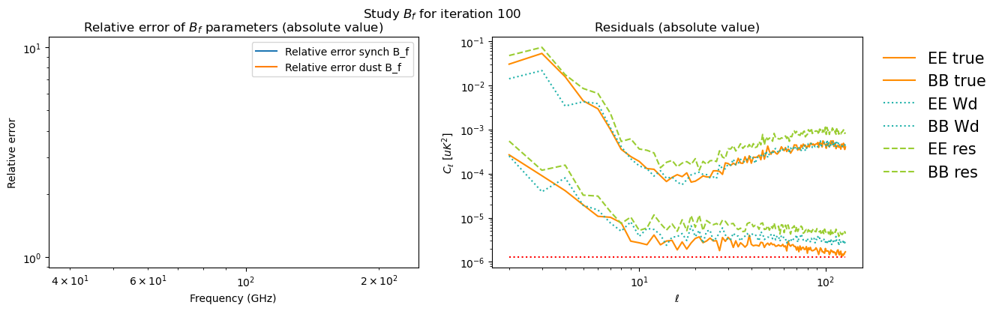

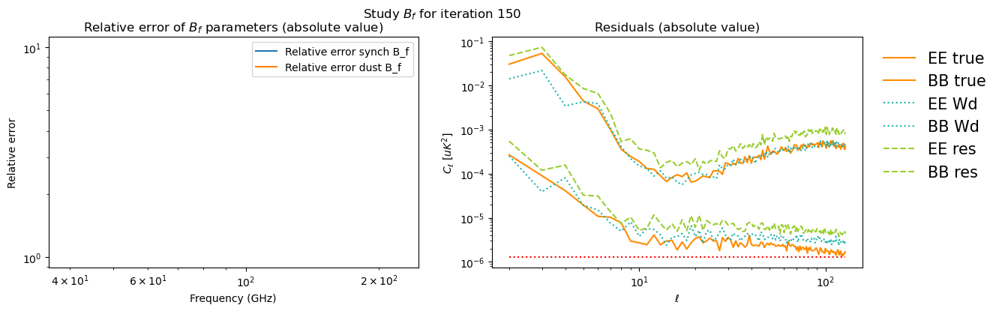

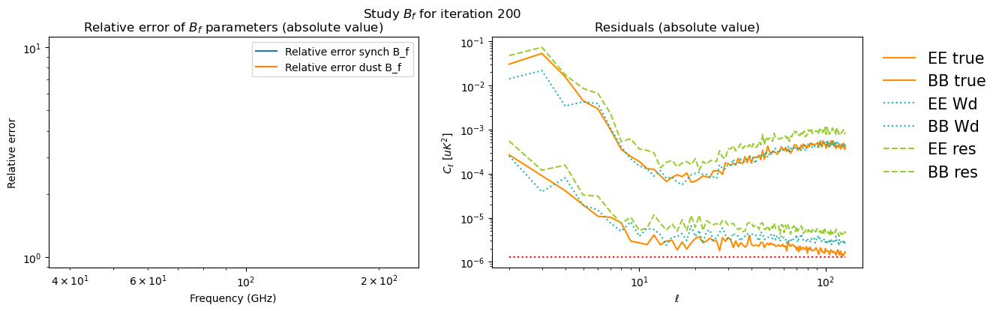

...

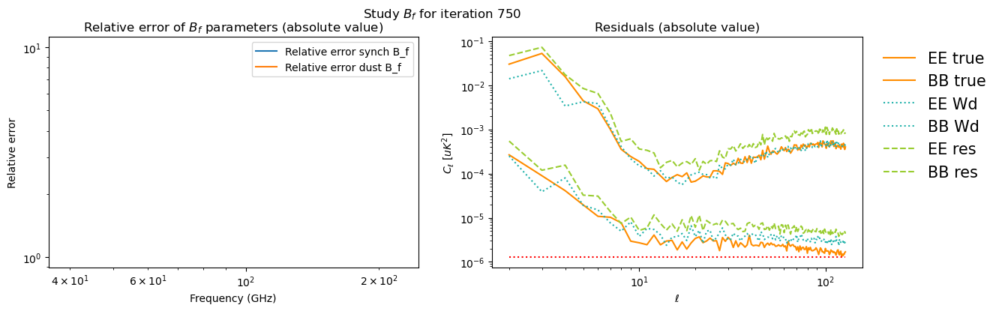

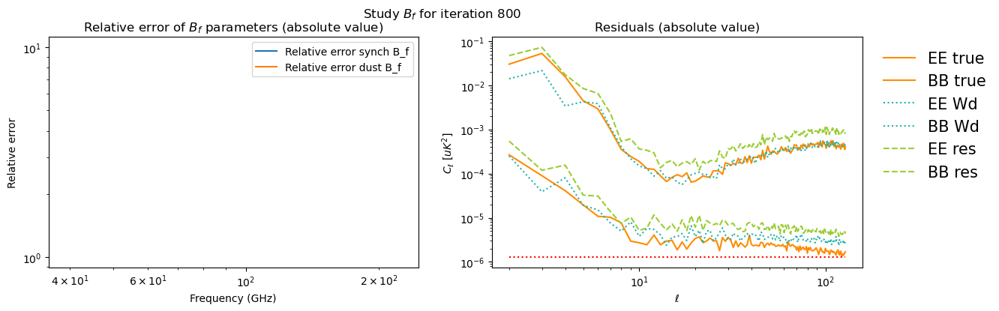

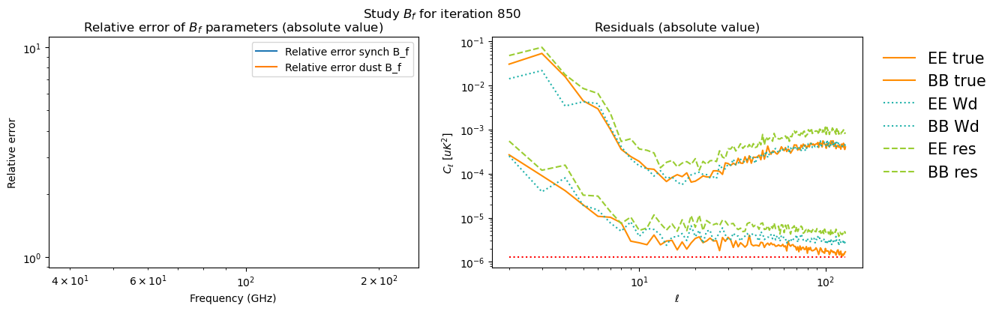

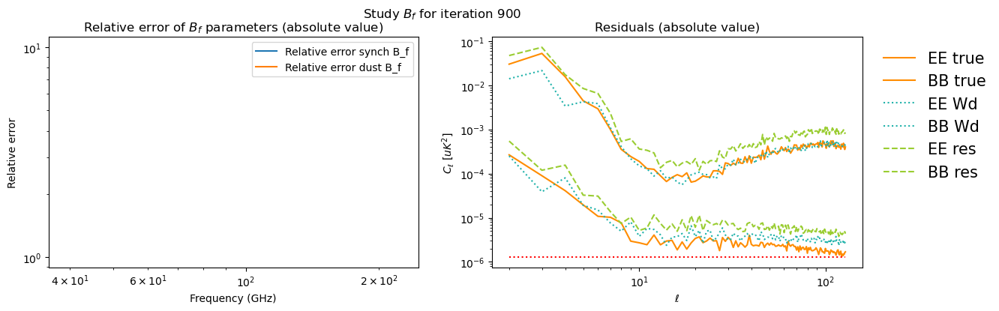

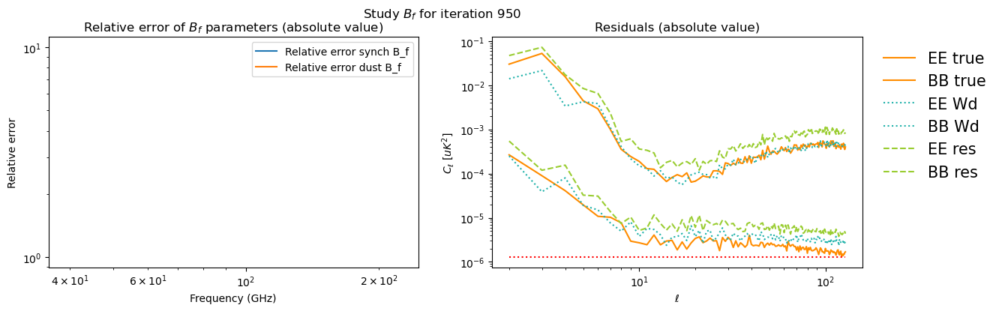

In [39]:
list_correl = ['EE', 'BB', 'EB']

ell_arange = np.arange(red_cov_approx_matrix.shape[0]) + lmin
min_value_mean = 3
factor_mean = (2*ell_arange[min_value_mean:] + 1)/(2*ell_arange[min_value_mean:] + 1 - 2 - 2*nstokes)

frequency_Bf = instrument['frequency'][1:-1]

for iteration in range(0,MICMAC_sampler_obj.number_iterations_sampling,sub_step_sampling):
    covariance_noise = np.zeros_like(c_ell_approx)

    mixing_matrix_obj.update_params(all_params_mixing_matrix_samples[iteration])
    mixing_matrix_sampled = mixing_matrix_obj.get_B()
    BtinvNB = micmac.get_inv_BtinvNB(freq_inverse_noise, mixing_matrix_sampled)
    BtinvN_sqrt = micmac.get_BtinvN(scipy.linalg.sqrtm(freq_inverse_noise), mixing_matrix_sampled)
    BtinvN = micmac.get_BtinvN(freq_inverse_noise, mixing_matrix_sampled)
    s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps, jax_use=False)[0]
    # s_cML = micmac.get_Wd(freq_inverse_noise, mixing_matrix_sampled, initial_freq_maps_only_B, jax_use=False)[0]

    full_map_s_cML_extended = np.vstack([np.zeros_like(s_cML[0,...]), s_cML])
    c_ell_s_cML = hp.anafast(full_map_s_cML_extended, lmax=lmax, iter=n_iter)[indices_polar,lmin:]

    first_residual = input_cmb_maps[0] - s_cML
    # first_residual = input_cmb_maps[0] - (all_s_c_WF_maps[iteration]+all_s_c_fluct_maps[iteration])
    # first_residual = initial_freq_maps - s_cML

    full_map_true_CMB_2_extended = np.vstack([np.zeros_like(input_cmb_maps[0,0,...]), input_cmb_maps[0]])
    c_ell_true_CMB_2 = hp.anafast(full_map_true_CMB_2_extended, lmax=lmax, iter=n_iter)#[:,lmin:]

    c_ell_s_cML = hp.anafast(np.vstack([np.zeros_like(s_cML[0]),s_cML]), lmax=lmax, iter=n_iter)

    c_ell_first_residual = hp.anafast(np.vstack([np.zeros_like(first_residual[0]),first_residual]), lmax=lmax, iter=n_iter)
    ell_arange = np.arange(c_ell_first_residual.shape[1])

    _cl_noise_harm = micmac.get_Cl_noise(np.array(instrument['depth_p']), mixing_matrix_sampled, lmax)[0,0,lmin:]
    red_cl_noise_harm = micmac.get_reduced_matrix_from_c_ell(np.array([_cl_noise_harm,_cl_noise_harm,np.zeros_like(_cl_noise_harm)]))
    cl_noise_harm = micmac.get_c_ells_from_red_covariance_matrix(red_cl_noise_harm)
    
    relative_error_synch = np.abs((init_params[:,0]-all_params_mixing_matrix_samples[iteration,:,0])/init_params[:,0])
    relative_error_dust = np.abs((init_params[:,1]-all_params_mixing_matrix_samples[iteration,:,1])/init_params[:,1])

    plt.figure(figsize=(14,4))
    plt.suptitle(r"Study $B_f$ for iteration {}".format(iteration))

    plt.subplot(121)

    # plt.plot([frequency_Bf[1],frequency_Bf[number_frequencies-2]], [0,0], 'k:', label='0')
    plt.plot(frequency_Bf, relative_error_synch, label='Relative error synch B_f')
    plt.plot(frequency_Bf, relative_error_dust, label='Relative error dust B_f')
    # plt.plot(frequency_Bf, all_params_mixing_matrix_samples[iteration,:,0], '-.', label='Sample synch B_f')
    # plt.plot(frequency_Bf, all_params_mixing_matrix_samples[iteration,:,1], '-.', label='Sample dust B_f')
    plt.title("Relative error of $B_f$ parameters (absolute value)")
    plt.xlabel('Frequency (GHz)')
    plt.ylabel("Relative error")
    plt.legend()
    plt.xscale('log')
    # plt.yscale('symlog')
    plt.yscale('log')

    plt.subplot(122)
    # plt.plot(ell_arange[lmin:], np.abs(c_ell_true_CMB_2).T, color='darkorange')
    # plt.plot(ell_arange[lmin:], np.abs(c_ell_s_cML[indices_polar,lmin:]).T, ':', color='lightseagreen')
    # plt.plot(ell_arange[lmin:], np.abs(c_ell_first_residual[indices_polar,lmin:]).T, '--', color='yellowgreen')
    plt.plot(ell_arange[lmin:], np.abs(c_ell_true_CMB_2[partial_indices_polar,lmin:]).T, color='darkorange')
    plt.plot(ell_arange[lmin:], np.abs(c_ell_s_cML[partial_indices_polar,lmin:]).T, ':', color='lightseagreen')
    plt.plot(ell_arange[lmin:], np.abs(c_ell_first_residual[partial_indices_polar,lmin:]).T, '--', color='yellowgreen')
    plt.plot(np.arange(c_ells_s_c_fluct.shape[-1])+MICMAC_sampler_obj.lmin, cl_noise_harm[0,:], 'r:', label='noise $N_c$')
    # plt.plot(ell_arange[lmin:], np.abs(c_ell_first_residual[indices_polar,lmin:]/c_ell_true_CMB_2).T, '--')
    
    # plt.plot(ell_arange, np.abs(c_ell_first_residual).T)
    plt.title("Residuals (absolute value)")
    plt.ylabel("$C_\ell$ [$uK^2$]")
    plt.xlabel("$\ell$")
    plt.loglog()
    # plt.legend(['TT', 'EE', 'BB', 'TE', 'EB', 'TB'])
    # plt.legend(['EE true', 'BB true', 'EB true', 'EE res', 'BB res', 'EB res'])
    # plt.legend(['EE true', 'BB true', 'EB true', 'EE Wd', 'BB Wd', 'EB Wd', 'EE res', 'BB res', 'EB res'], bbox_to_anchor=(1.02, 1), loc="upper left", prop={'size': 15}, frameon=False)
    plt.legend(['EE true', 'BB true', 'EE Wd', 'BB Wd', 'EE res', 'BB res'], bbox_to_anchor=(1.02, 1), loc="upper left", prop={'size': 15}, frameon=False)
    # plt.legend(['EE Wd', 'BB Wd', 'EB Wd', 'EE Wd', 'BB res', 'EB res'])
    # plt.legend(['EE Wd', 'BB Wd', 'EB Wd', 'EE Wd', 'BB res', 'EB res'])


    plt.show()

In [35]:
MICMAC_sampler_obj.r_true

0.01

In [36]:
a_test = np.array([[1]])
b_test = np.arange(20).reshape((1,20))

In [37]:
np.hstack([a_test,b_test])

array([[ 1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14,
        15, 16, 17, 18, 19]])